In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import re
from pyvi.ViTokenizer import tokenize
from underthesea import word_tokenize
%matplotlib inline

In [2]:
%%time
data_train = []
with open('train.txt', 'r', encoding='utf-8') as f:
    for line in f.readlines():
        tmp = line.strip().split()
        data_train.append((tmp[0], ' '.join(tmp[1:])))
df_train = pd.DataFrame(data_train, columns=['label', 'title'])

data_test = []
with open('test.txt', 'r', encoding='utf-8') as f:
    for line in f.readlines():
        tmp = line.strip().split()
        data_test.append((tmp[0], ' '.join(tmp[1:])))
df_test = pd.DataFrame(data_test, columns=['label', 'title'])

Wall time: 221 ms


In [6]:
def preprocessing(title):
    special_char = '[^\sabcdefghijklmnopqrstuvwxyzàáâãèéêìíòóôõùúýăđĩũơưạảấầẩẫậắằẳẵặẹẻẽếềểễệỉịọỏốồổỗộớờởỡợụủứừửữựỳỵỷỹ_]'
    title = re.sub(special_char, '', title)
    result = []
    for w in word_tokenize(title, format='text').split():
        if re.search('[^bcdđfghjklmnpqrstvwx]', w) and len(w)>=2:
            result.append(w)
    return ' '.join(result)

In [7]:
preprocessing('ổ cắm')

'ổ_cắm'

In [8]:
df_train['processed'] = df_train.title.apply(lambda x: preprocessing(x))

In [21]:
df_train.sample(10)

,label,title,processed
1384,__label__1.0,dây cáp sạc belkin,dây_cáp sạc belkin
40035,__label__14.0,dĩa gốm meng,dĩa gốm meng
23246,__label__1.0,lót chuột kakashi,lót chuột kakashi
84572,__label__12.0,"mặt mùi, lai đại nhật,",mặt mùi lai đại nhật
89478,__label__9.0,nước giặt d,nước giặt
54433,__label__12.0,áo khoác exploration,áo_khoác exploration
86602,__label__24.0,balo thỏ baby,balo thỏ baby
23323,__label__12.0,quần nam body,quần nam body
69832,__label__1.0,sạc yobao,sạc yobao
85105,__label__12.0,"áo m,",áo


In [22]:
word_tokenize("ví dài sina	", format="text")

'ví dài sina'

In [23]:
df_train.processed.duplicated().sum()

5348

In [24]:
df_train_preprocessed = df_train[['label', 'processed']].drop_duplicates()

In [25]:
df_train_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87502 entries, 0 to 91867
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   label      87502 non-null  object
 1   processed  87502 non-null  object
dtypes: object(2)
memory usage: 2.0+ MB


In [26]:
labels = df_train_preprocessed.label.unique()

In [27]:
lb_count_train = df_train_preprocessed.label.value_counts()
# lb_count_test = df_test.label.value_counts()
print('Tỉ lệ các nhãn trong tập train, test : ')
for lb in labels:
    print(f'{lb[7:]:7}', end=' : ')
print('\b\b\n')

for lb in labels:
    print(f'{round(lb_count_train[lb]/lb_count_train[-1]):7d}', end=' : ')
print('\b\b\n')

# for lb in labels:
#     print(f'{round(lb_count_test[lb]/lb_count_test[-1]):12d}', end=' : ')
# print('\b\b')

Tỉ lệ các nhãn trong tập train, test : 
__1.0   : __14.0  : __11.0  : __24.0  : __12.0  : __16.0  : __9.0   : 

     11 :      14 :       9 :       4 :      13 :       1 :       3 : 



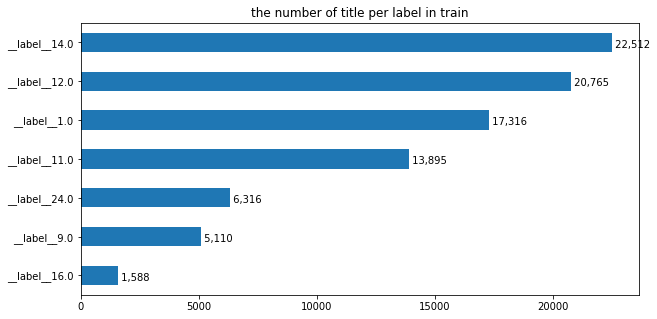

In [28]:
plt.figure(figsize=(10,5))

ax = df_train_preprocessed.label.value_counts().plot.barh()
ax.set_title("the number of title per label in train", fontsize=12)

for patch in ax.patches:
    ax.text(patch.get_width() + 0.3, patch.get_y() + 0.38, " {:,}".format(patch.get_width()), fontsize=10, color='black')

ax.invert_yaxis()

In [29]:
df_train_preprocessed['len'] = df_train_preprocessed.processed.apply(lambda x: len(x.split()))

In [30]:
df_train_preprocessed.len.value_counts()

3     32778
2     24999
4     18774
5      7070
6      2242
1       744
7       654
8       177
9        38
10       14
11        7
0         3
12        1
14        1
Name: len, dtype: int64

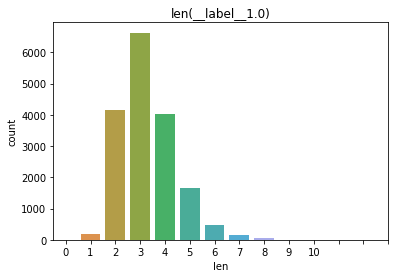

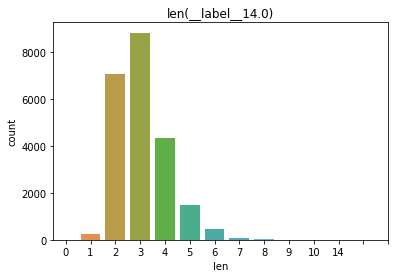

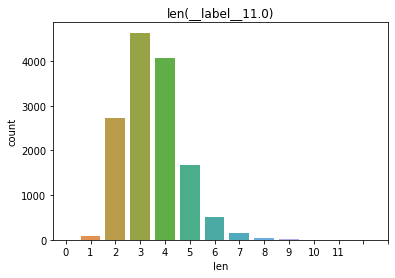

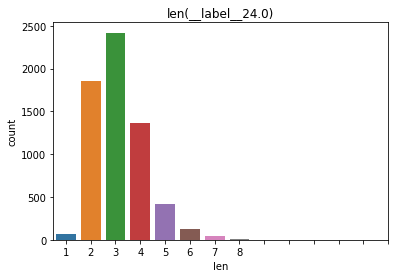

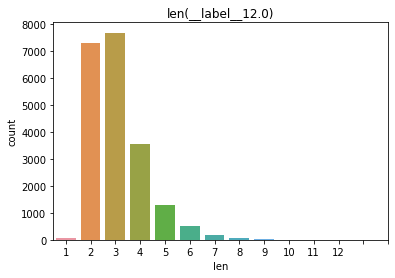

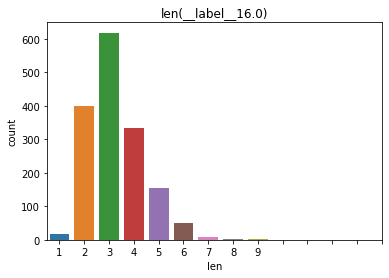

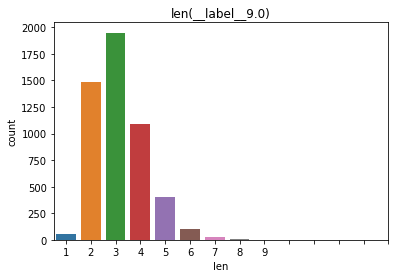

In [31]:
for lb in labels:
    sns.countplot(x='len', data=df_train_preprocessed[df_train_preprocessed.label==lb]).set_title(f'len({lb})')
    plt.xticks(range(14))
    plt.show()

<AxesSubplot:xlabel='label', ylabel='len'>

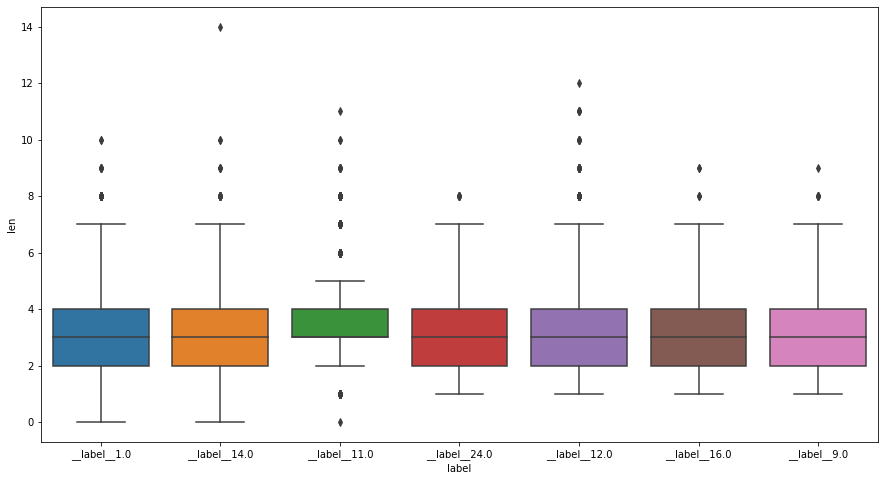

In [32]:
plt.figure(figsize=(15,8))
sns.boxplot(x='label',y='len',data=df_train_preprocessed)

In [161]:
df_train[df_train.label=='__label__11.0']

,label,title,processed
29,__label__11.0,son asami,son asami
30,__label__11.0,bb cream asami,cream asami
31,__label__11.0,cc cream asami,cream asami
32,__label__11.0,phấn mắt asami,phấn mắt asami
33,__label__11.0,phấn nền asami,phấn nền asami
...,...,...,...
91797,__label__11.0,thực phẩm bảo vệ sức khoẻ,thực_phẩm bảo_vệ sức_khoẻ
91818,__label__11.0,máy khuếch tán mipow vaso,máy khuếch_tán mipow vaso
91820,__label__11.0,máy khuếch tán,máy khuếch_tán
91856,__label__11.0,thực phẩm timoga maxx,thực_phẩm timoga maxx


In [33]:
df_train_preprocessed = df_train_preprocessed[(df_train_preprocessed.len>0) & (df_train_preprocessed.len<9)]

In [34]:
df_train_preprocessed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87438 entries, 0 to 91867
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   label      87438 non-null  object
 1   processed  87438 non-null  object
 2   len        87438 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 2.7+ MB


In [35]:
lb_count_train = df_train_preprocessed.label.value_counts()
# lb_count_test = df_test.label.value_counts()
print('Tỉ lệ các nhãn trong tập train: ')
for lb in labels:
    print(f'{lb[7:]:7}', end=' : ')
print('\b\b\n')

for lb in labels:
    print(f'{round(lb_count_train[lb]/lb_count_train[-1]):7d}', end=' : ')
print('\b\b\n')

Tỉ lệ các nhãn trong tập train: 
__1.0   : __14.0  : __11.0  : __24.0  : __12.0  : __16.0  : __9.0   : 

     11 :      14 :       9 :       4 :      13 :       1 :       3 : 



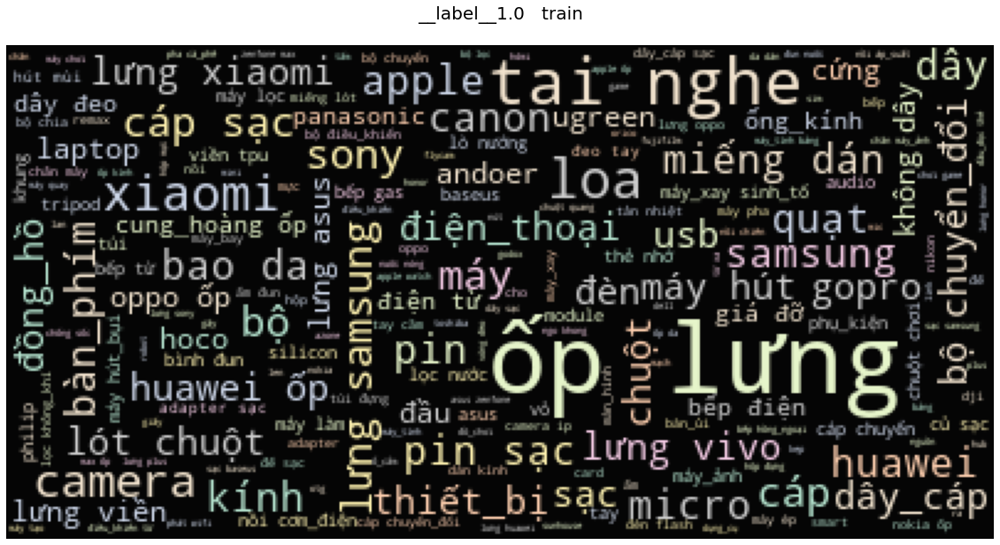

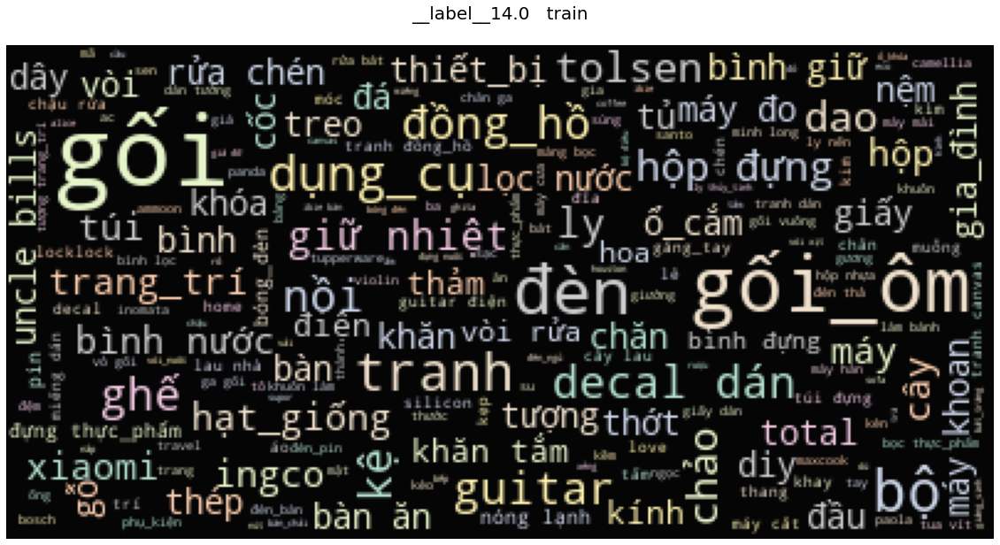

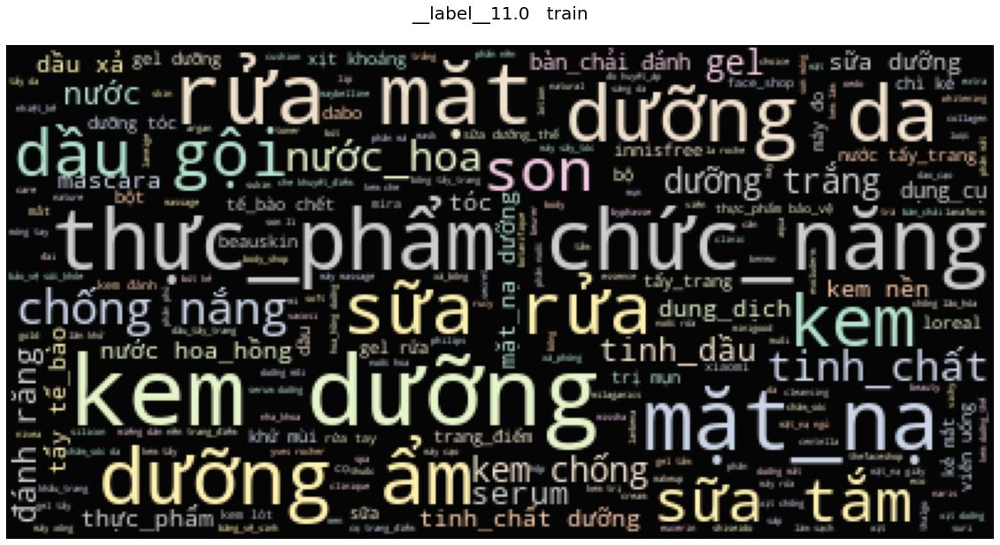

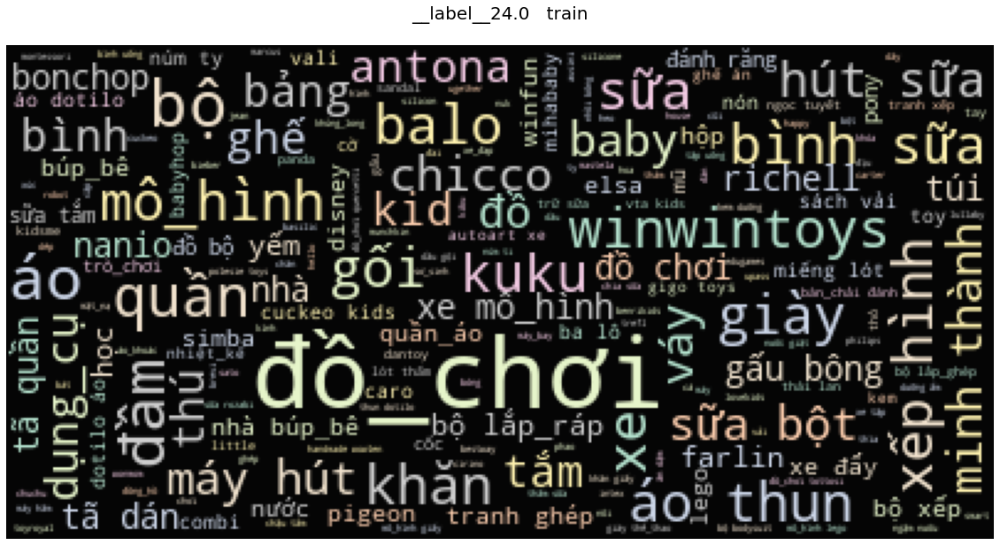

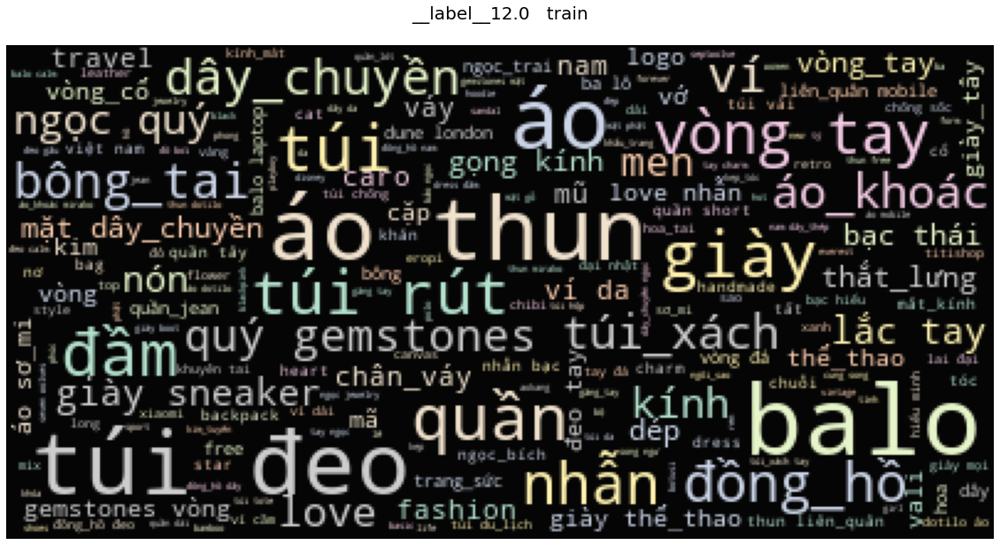

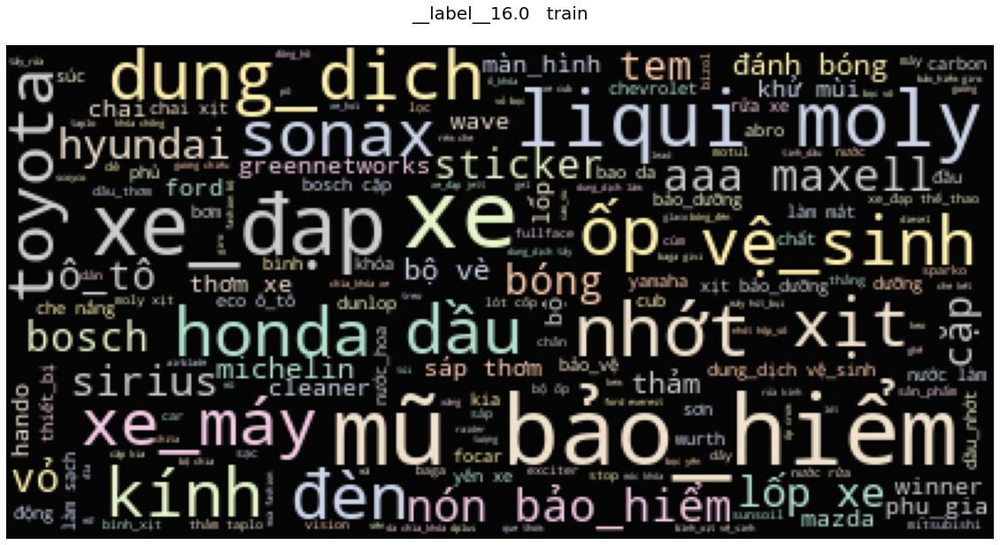

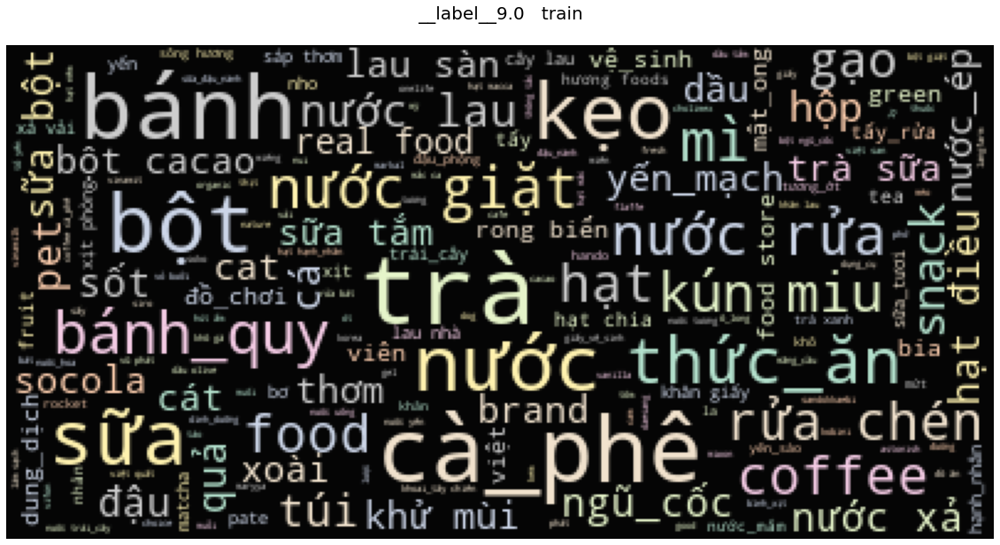

In [36]:
for i in range(len(labels)):
    lb1 = df_train_preprocessed[df_train_preprocessed.label==labels[i]]['processed'].values
    plt.figure(figsize=(20,13))
    wc = WordCloud(background_color="black", max_font_size= 40)
    wc.generate(" ".join(lb1))
    plt.title(labels[i]+'   train\n', fontsize=20)
    plt.imshow(wc.recolor( colormap= 'Pastel2' , random_state=17), alpha=0.98)
    plt.axis('off')

In [37]:
df_train_preprocessed[['label', 'processed']].to_csv('train_preprocessed.csv', index=False)

In [38]:
df_test['processed'] = df_test.title.apply(lambda x: preprocessing(x))

In [39]:
df_test_preprocessed = df_test[['label', 'processed']].drop_duplicates()
df_test_preprocessed['len'] = df_test_preprocessed.processed.apply(lambda x: len(x.split()))
df_test_preprocessed = df_test_preprocessed[(df_test_preprocessed.len>0) & (df_test_preprocessed.len<9)]

In [40]:
df_test_preprocessed.sample(10)

,label,processed,len
5200,__label__12.0,ví da nappa thật,4
4132,__label__12.0,áo thun bigsize,3
13361,__label__12.0,quần_jean aaa aquamarine,3
18769,__label__1.0,bàn_phím xenics,2
4901,__label__24.0,nôi rung mastela,3
18039,__label__14.0,artificial eucalyptus fashion,3
4336,__label__14.0,biển quảng hikaru,3
7728,__label__14.0,diver tooarts fiberglass,3
52,__label__1.0,tai nghe smartphone,3
364,__label__12.0,đầm rlachel dress,3


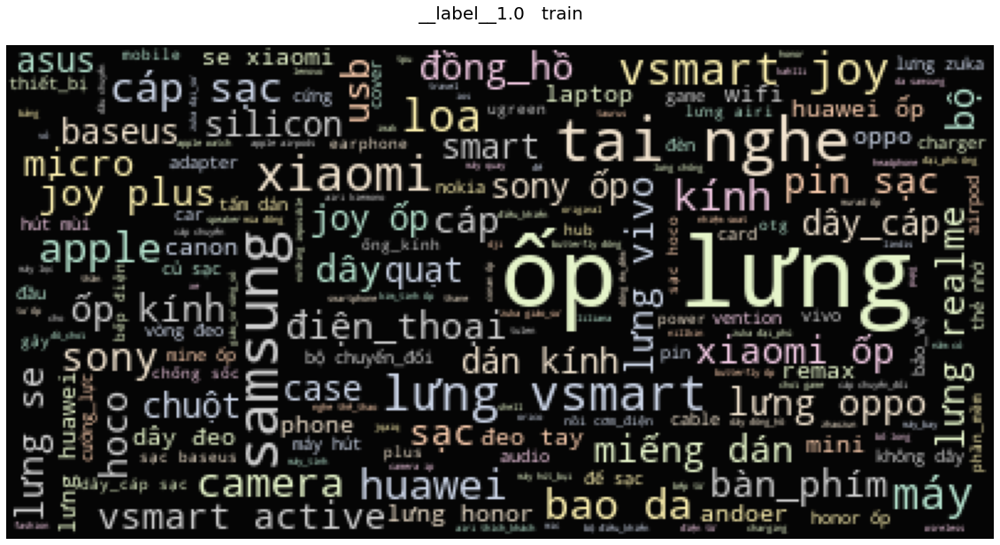

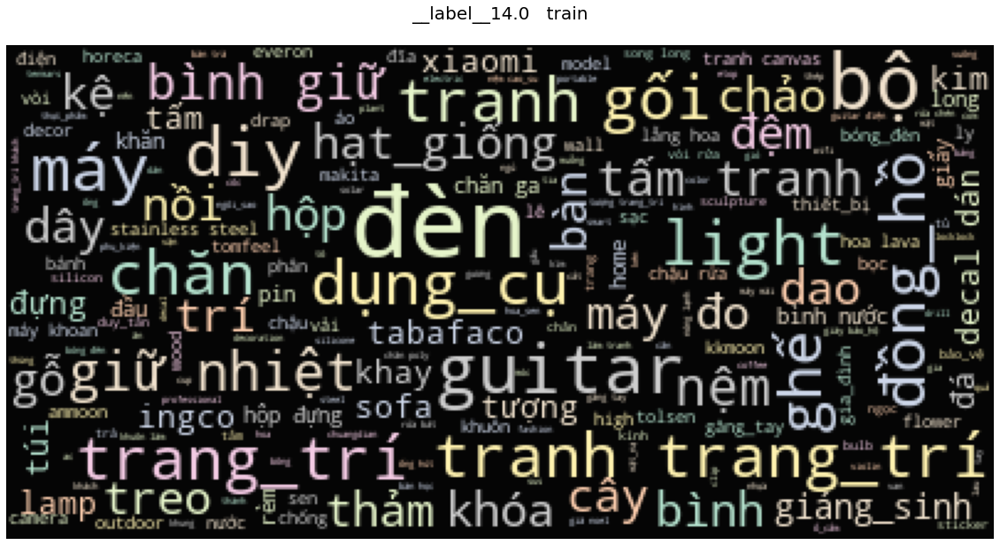

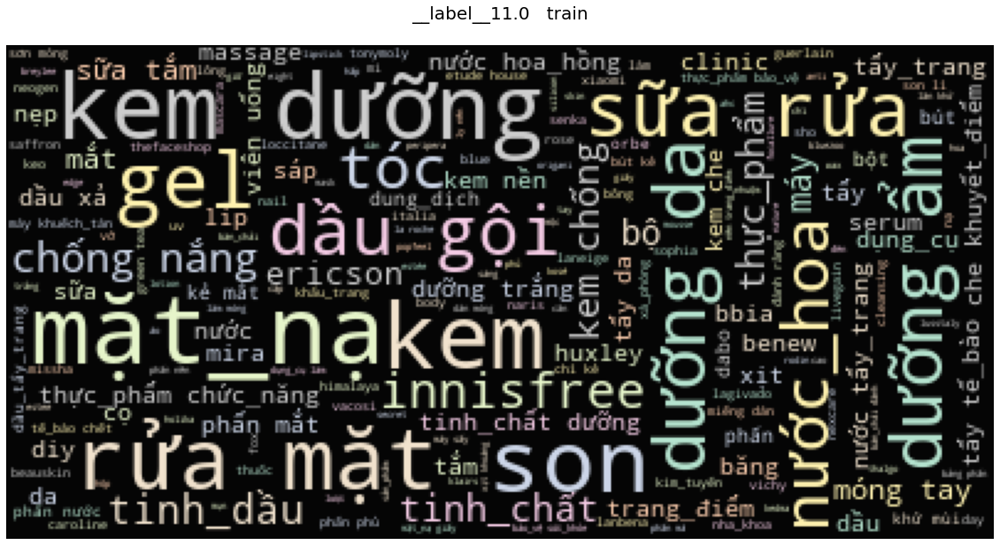

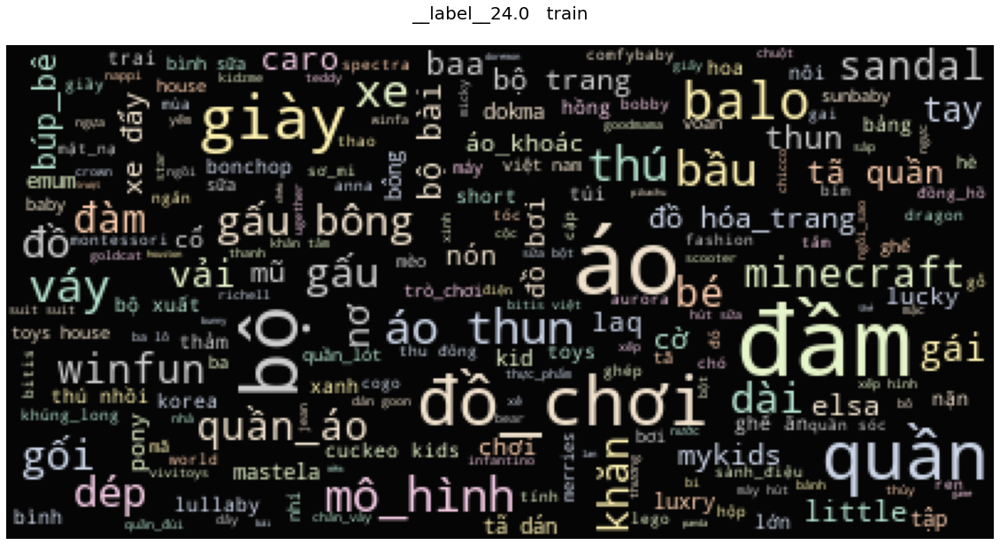

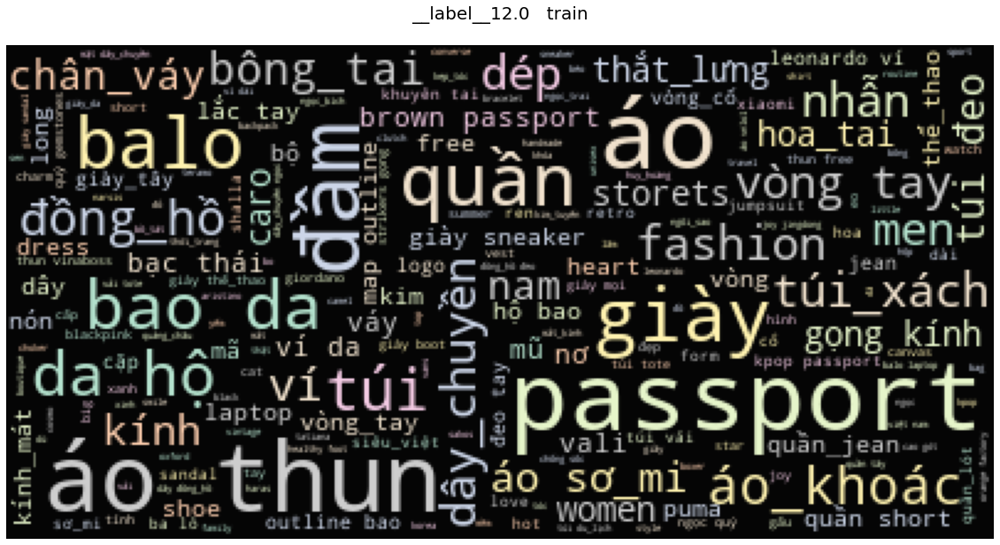

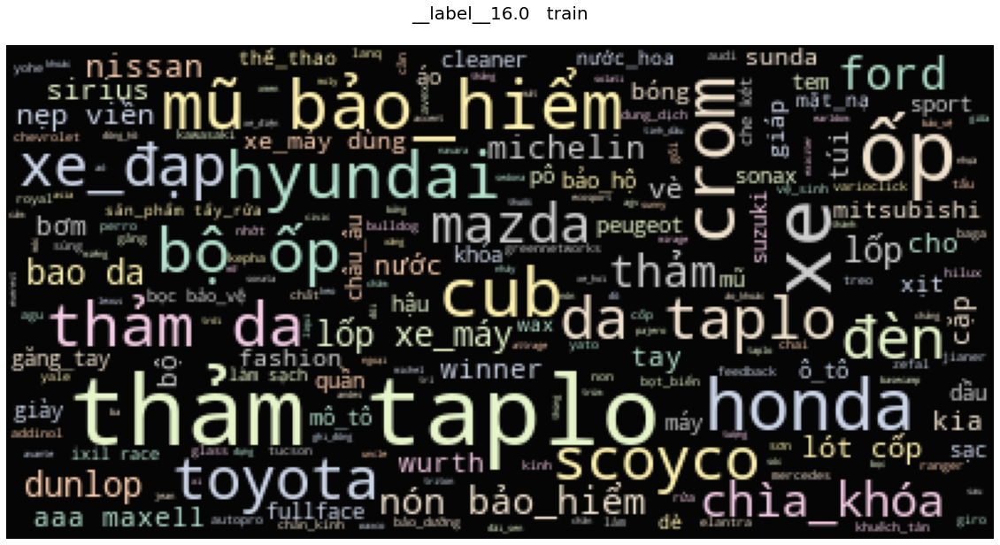

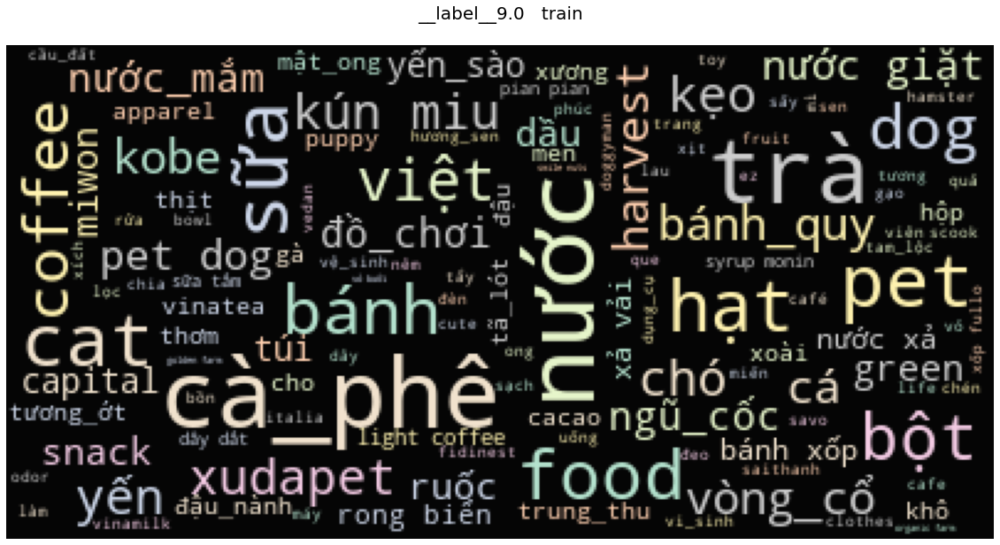

In [41]:
for i in range(len(labels)):
    lb1 = df_test_preprocessed[df_test_preprocessed.label==labels[i]]['processed'].values
    plt.figure(figsize=(20,13))
    wc = WordCloud(background_color="black", max_font_size= 40)
    wc.generate(" ".join(lb1))
    plt.title(labels[i]+'   train\n', fontsize=20)
    plt.imshow(wc.recolor( colormap= 'Pastel2' , random_state=17), alpha=0.98)
    plt.axis('off')

In [42]:
df_test_preprocessed[['label', 'processed']].to_csv('test_preprocessed.csv', index=False)